In [2]:
!pip install mne

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 34.6 MB/s eta 0:00:00


In [74]:
import pandas as pd
import numpy as np
import pandas as pd
import mne
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
import pywt


In [4]:
#Data with 50 subjects
file_path = './data/data_5_subjects.csv'
data_50 = pd.read_csv(file_path)

In [5]:
unique = data_50['file_name'].nunique()
unique

50

In [6]:
#Train csv
file_path = './train_data.csv'
train_df = pd.read_csv(file_path)

In [7]:
is_unique = not train_df['eeg_id'].duplicated().any()

if is_unique:
    print("All values in 'eeg_id' column are unique.")
else:
    print("Duplicate values found in 'eeg_id' column.")

Duplicate values found in 'eeg_id' column.


In [8]:
!curl --header "Host: storage.googleapis.com" --header "User-Agent: Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/124.0.0.0 Safari/537.36" --header "Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.7" --header "Accept-Language: en-US,en;q=0.9" --header "Referer: https://www.kaggle.com/" "https://storage.googleapis.com/kaggle-competitions-data/kaggle-v2/59093/7469972/bundle/archive.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1717051377&Signature=g8g9aXZJ4O0AMbj2GjUla%2FfEEWPA1%2B5PAZ644vUSG4TM2BR%2Be%2FVksk5H8ZWns0u8HlpnwjgTjQAYa4SjfoQSAeszYiiUxC6SiA3h3ZALw1Z9GBIWBB6C4P%2FmHyLl2%2Bpjl4Zu%2FW70hApzAJfRPGGGwTQVltHvHMMsoPJGo5KBRlncv2IOAp05orJyL4A0u%2FUtgxWwJC0PiVOqJSkdwdX4GMpFvvk1NkSivn79%2Bz5yBl3TL0y0KCPweuZXxc9x4LECCC8b6Caz085M8JcX4rYQGDJ49zl0G8T%2BC7Hcb%2BQ0vXKNk6axh6cNKRCa1gR6q3YFjNHVxdRT9ZcGQjCP5v8GmQ%3D%3D&response-content-disposition=attachment%3B+filename%3Dhms-harmful-brain-activity-classification.zip" -L -o "hms-harmful-brain-activity-classification.zip"

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 18.4G  100 18.4G    0     0  79.8M      0  0:03:56  0:03:56 --:--:-- 73.0M


In [9]:
import os
os.listdir('.')

['.config',
 'hms-harmful-brain-activity-classification.zip',
 'drive',
 'sample_data']

In [10]:
!unzip -q hms-harmful-brain-activity-classification.zip

In [11]:
os.listdir('.')

['.config',
 'hms-harmful-brain-activity-classification.zip',
 'drive',
 'train_spectrograms',
 'test.csv',
 'train_eegs',
 'example_figures',
 'test_spectrograms',
 'sample_submission.csv',
 'test_eegs',
 'train.csv',
 'sample_data']

In [12]:
train_metadata_dir = "train.csv"
train_df = pd.read_csv(train_metadata_dir)
train_df

,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote
0,1628180742,0,0.0,353733,0,0.0,127492639,42516,Seizure,3,0,0,0,0,0
1,1628180742,1,6.0,353733,1,6.0,3887563113,42516,Seizure,3,0,0,0,0,0
2,1628180742,2,8.0,353733,2,8.0,1142670488,42516,Seizure,3,0,0,0,0,0
3,1628180742,3,18.0,353733,3,18.0,2718991173,42516,Seizure,3,0,0,0,0,0
4,1628180742,4,24.0,353733,4,24.0,3080632009,42516,Seizure,3,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106795,351917269,6,12.0,2147388374,6,12.0,4195677307,10351,LRDA,0,0,0,3,0,0
106796,351917269,7,14.0,2147388374,7,14.0,290896675,10351,LRDA,0,0,0,3,0,0
106797,351917269,8,16.0,2147388374,8,16.0,461435451,10351,LRDA,0,0,0,3,0,0
106798,351917269,9,18.0,2147388374,9,18.0,3786213131,10351,LRDA,0,0,0,3,0,0


In [13]:
#Saving the signal categories in variable
categories = train_df['expert_consensus'].unique()
print(categories)

['Seizure' 'GPD' 'LRDA' 'Other' 'GRDA' 'LPD']


In [14]:
TARGETS = train_df.columns[-6:]
print(TARGETS)

Index(['seizure_vote', 'lpd_vote', 'gpd_vote', 'lrda_vote', 'grda_vote',
       'other_vote'],
      dtype='object')


In [15]:
spectrogram_dir = "train_spectrograms"
train_eegs_dir = 'train_eegs'
print(train_eegs_dir)
print(spectrogram_dir)

train_df['spectrogram_file_path'] = f'{spectrogram_dir}/'+train_df['spectrogram_id'].astype(str)+'.parquet'
train_df['eeg_file_path'] = f'{train_eegs_dir}/'+train_df['eeg_id'].astype(str)+'.parquet'

train_eegs
train_spectrograms


## **Exploring EEG Data**
### **Electrode placements**

Fp1 and Fp2: Frontopolar electrodes on the left and right sides, respectively.

F3 and F4: Frontal electrodes.

C3 and C4: Central electrodes.

P3 and P4: Parietal electrodes.

F7 and F8: Frontal electrodes placed slightly more laterally than F3 and F4.

T3 and T4: Temporal electrodes.

T5 and T6: Mastoid electrodes.

O1 and O2: Occipital electrodes.

Fz, Cz, and Pz: Midline electrodes corresponding to frontal, central, and parietal regions, respectively.

These electrode names follow the international 10-20 system for electrode placement in EEG recordings.



In the code below:


*   mont1020.dig contains the digitization points, including fiducial points and channel locations.

*   mont1020.dig[0:3] represents the fiducial points (nasion, left, and right ear) and is kept unchanged.
*   [mont1020.dig[x+3] for x in ind] selects the digitization points corresponding to the channels specified in kept_channels.


*   By combining these two lists, mont1020_new.dig contains the digitization information for both the fiducial points and the desired channels. This ensures that the new montage (mont1020_new) retains the necessary digitization information for plotting the desired channels correctly.

In [16]:
parquet_filename = 'train_eegs/3492492422.parquet'
sample_eeg_df = pd.read_parquet(parquet_filename)

In [17]:
sample_eeg_df

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,Pz,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG
0,9.630000,2.800000,40.580002,14.45,9.570000,20.400000,10.31,35.910000,18.549999,35.580002,25.549999,-25.379999,14.740000,34.090000,15.880000,-24.840000,-5.140000,-11.09,19.290001,9.230000
1,21.139999,5.400000,37.470001,9.95,6.610000,12.700000,2.74,28.620001,21.490000,34.580002,18.170000,-0.970000,19.469999,29.670000,8.080000,-27.090000,-11.500000,-19.52,8.030000,137.610001
2,23.959999,5.820000,36.889999,8.48,4.530000,9.970000,1.24,26.270000,22.389999,35.480000,16.430000,6.570000,20.889999,28.049999,6.340000,-27.110001,-13.070000,-21.57,5.590000,122.269997
3,5.680000,-0.440000,38.410000,13.23,4.650000,16.770000,8.19,34.529999,16.299999,33.259998,22.410000,-28.260000,12.070000,30.530001,12.440000,-26.750000,-7.100000,-12.68,16.660000,0.290000
4,11.530000,2.390000,38.230000,11.55,3.300000,13.670000,4.93,30.490000,19.530001,35.259998,19.790001,-15.150000,16.139999,28.990000,10.210000,-26.530001,-8.330000,-15.27,11.640000,89.199997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,52.259998,16.650000,41.119999,12.66,27.170000,23.080000,-4.74,4.540000,18.139999,25.360001,6.950000,43.040001,33.650002,24.299999,11.670000,17.190001,27.440001,0.97,7.970000,107.059998
9996,44.810001,14.950000,41.360001,15.30,26.790001,27.190001,-0.47,8.810000,16.490000,25.170000,11.250000,26.959999,30.740000,25.959999,15.920000,18.379999,30.430000,7.59,14.380000,13.490000
9997,32.230000,12.170000,42.830002,18.48,28.820000,31.850000,4.28,14.570000,12.620000,24.650000,15.060000,2.920000,29.209999,28.190001,19.299999,18.879999,35.279999,13.29,20.790001,-37.160000
9998,49.099998,17.700001,41.790001,14.12,27.270000,24.600000,-2.28,7.540000,18.510000,27.040001,9.840000,34.919998,31.610001,26.459999,13.880000,18.690001,30.049999,4.28,11.240000,86.089996


In [18]:
CHANNELS = sample_eeg_df.drop(columns=['EKG']).columns.tolist()
MONTAGE = mne.channels.make_standard_montage('standard_1020')

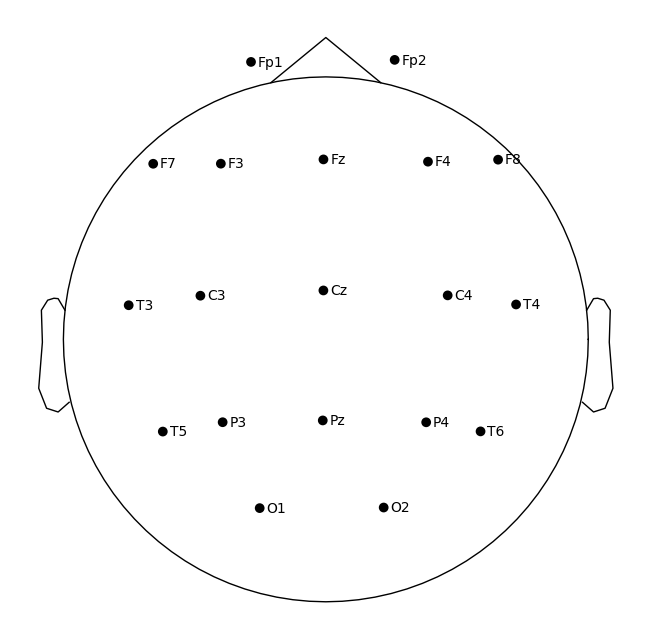

In [19]:
def plot_montage():
  ind = [i for (i, channel) in enumerate(MONTAGE.ch_names) if channel in CHANNELS]

  # Create a new montage with only the desired channels
  mont1020_new = MONTAGE.copy()
  mont1020_new.ch_names = [MONTAGE.ch_names[x] for x in ind]
  mont1020_new.dig = MONTAGE.dig[0:3] + [MONTAGE.dig[x+3] for x in ind]

  mont1020_new.plot()
plot_montage()

Column: Fp1, Max Value: 90.5199966430664, Min Value: -82.94999694824219
Column: F3, Max Value: 50.630001068115234, Min Value: -118.45999908447266
Column: C3, Max Value: 69.33000183105469, Min Value: -91.79000091552734
Column: P3, Max Value: 62.34000015258789, Min Value: -101.23999786376953
Column: F7, Max Value: 52.90999984741211, Min Value: -82.2699966430664
Column: T3, Max Value: 55.16999816894531, Min Value: -71.93000030517578
Column: T5, Max Value: 38.31999969482422, Min Value: -59.95000076293945
Column: O1, Max Value: 74.2300033569336, Min Value: -102.55000305175781
Column: Fz, Max Value: 61.7599983215332, Min Value: -159.94000244140625
Column: Cz, Max Value: 74.58000183105469, Min Value: -135.80999755859375
Column: Pz, Max Value: 67.77999877929688, Min Value: -117.48999786376953
Column: Fp2, Max Value: 72.05000305175781, Min Value: -145.57000732421875
Column: F4, Max Value: 78.9000015258789, Min Value: -128.69000244140625
Column: C4, Max Value: 72.44999694824219, Min Value: -114.

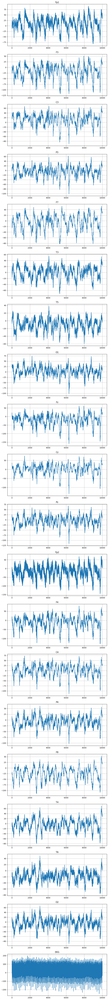

In [20]:
def plot_eeg_each_channel(sample_eeg_df):
  fig, ax = plt.subplots(20, figsize=(10, 100))

  for i, column in enumerate(sample_eeg_df.columns):
      ax[i].plot(sample_eeg_df.index, sample_eeg_df[column], label=column)
      ax[i].grid(True)
      ax[i].set_title(str(column))
      max_value = sample_eeg_df[column].max()
      min_value = sample_eeg_df[column].min()
      print(f"Column: {column}, Max Value: {max_value}, Min Value: {min_value}")
  plt.show()

plot_eeg_each_channel(sample_eeg_df)

<Info | 7 non-empty values
 bads: []
 ch_names: Fp1, F3, C3, P3, F7, T3, T5, O1, Fz, Cz, Pz, Fp2, F4, C4, P4, ...
 chs: 19 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 100.0 Hz
 meas_date: unspecified
 nchan: 19
 projs: []
 sfreq: 200.0 Hz
>
Creating RawArray with float64 data, n_channels=19, n_times=18000
    Range : 0 ... 17999 =      0.000 ...    89.995 secs
Ready.
Using matplotlib as 2D backend.


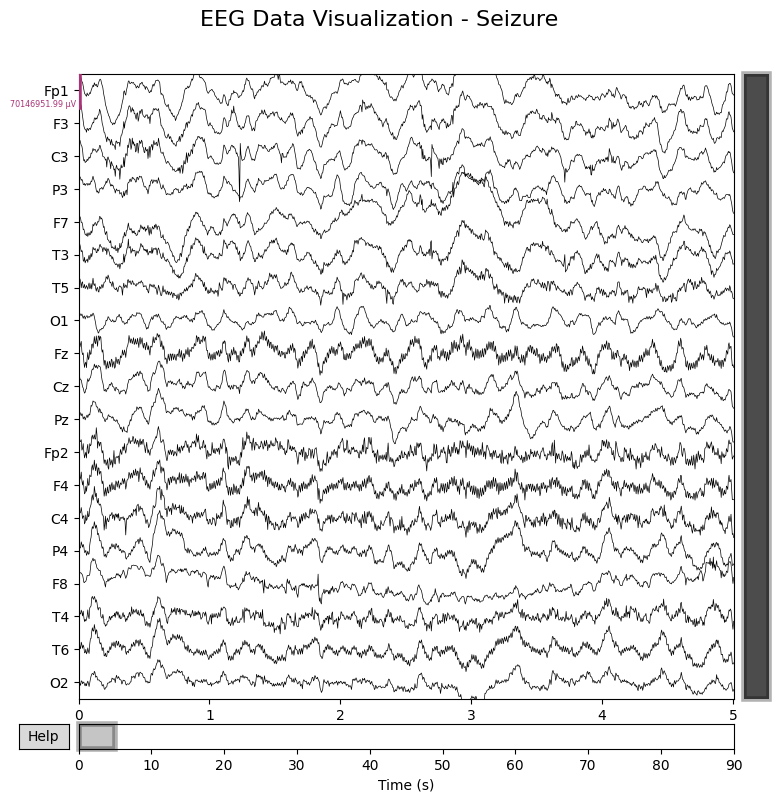

<Info | 7 non-empty values
 bads: []
 ch_names: Fp1, F3, C3, P3, F7, T3, T5, O1, Fz, Cz, Pz, Fp2, F4, C4, P4, ...
 chs: 19 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 100.0 Hz
 meas_date: unspecified
 nchan: 19
 projs: []
 sfreq: 200.0 Hz
>
Creating RawArray with float64 data, n_channels=19, n_times=10400
    Range : 0 ... 10399 =      0.000 ...    51.995 secs
Ready.


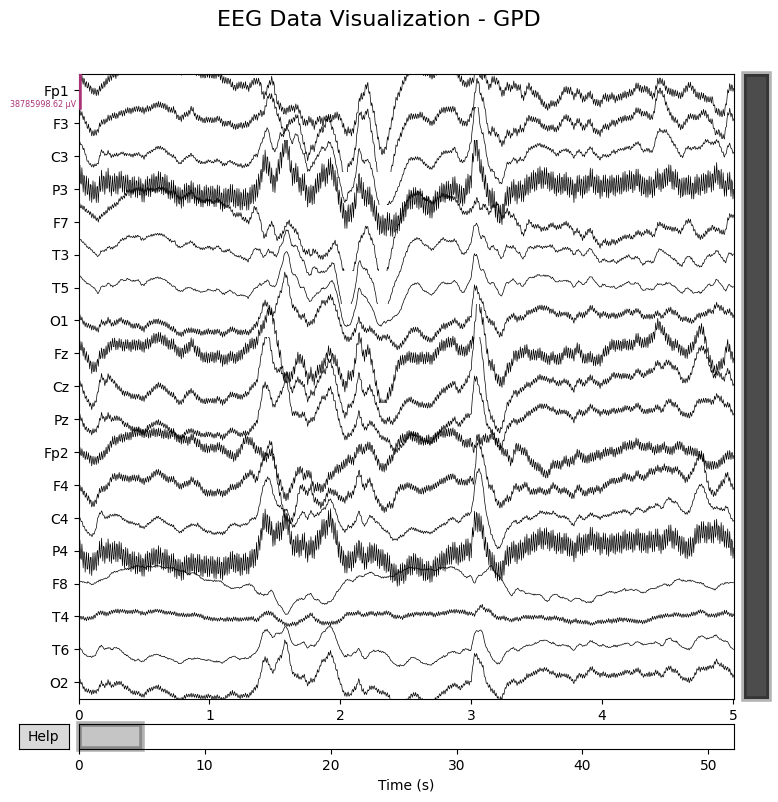

<Info | 7 non-empty values
 bads: []
 ch_names: Fp1, F3, C3, P3, F7, T3, T5, O1, Fz, Cz, Pz, Fp2, F4, C4, P4, ...
 chs: 19 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 100.0 Hz
 meas_date: unspecified
 nchan: 19
 projs: []
 sfreq: 200.0 Hz
>
Creating RawArray with float64 data, n_channels=19, n_times=14800
    Range : 0 ... 14799 =      0.000 ...    73.995 secs
Ready.


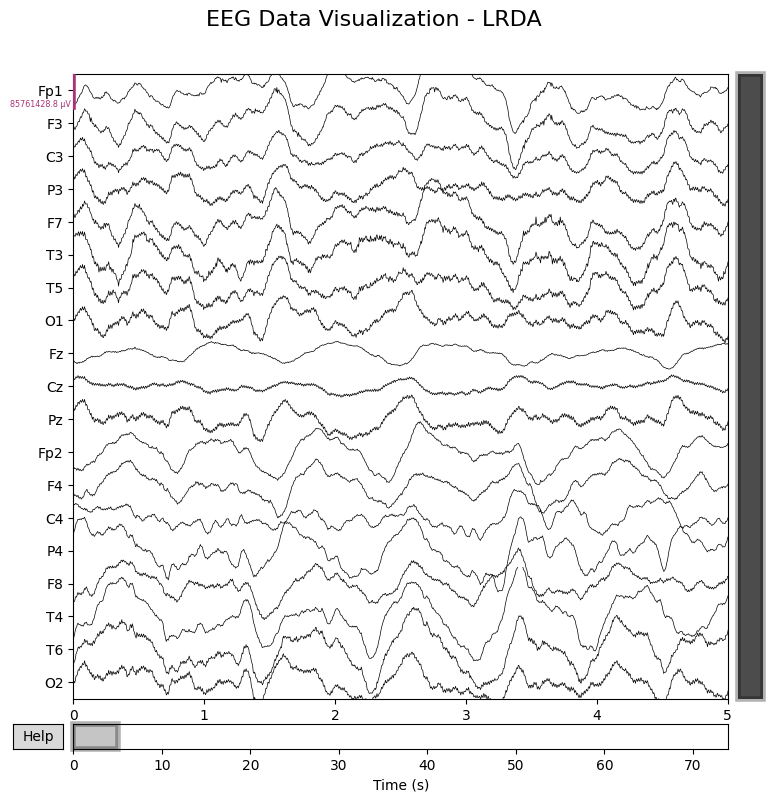

<Info | 7 non-empty values
 bads: []
 ch_names: Fp1, F3, C3, P3, F7, T3, T5, O1, Fz, Cz, Pz, Fp2, F4, C4, P4, ...
 chs: 19 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 100.0 Hz
 meas_date: unspecified
 nchan: 19
 projs: []
 sfreq: 200.0 Hz
>
Creating RawArray with float64 data, n_channels=19, n_times=10000
    Range : 0 ... 9999 =      0.000 ...    49.995 secs
Ready.


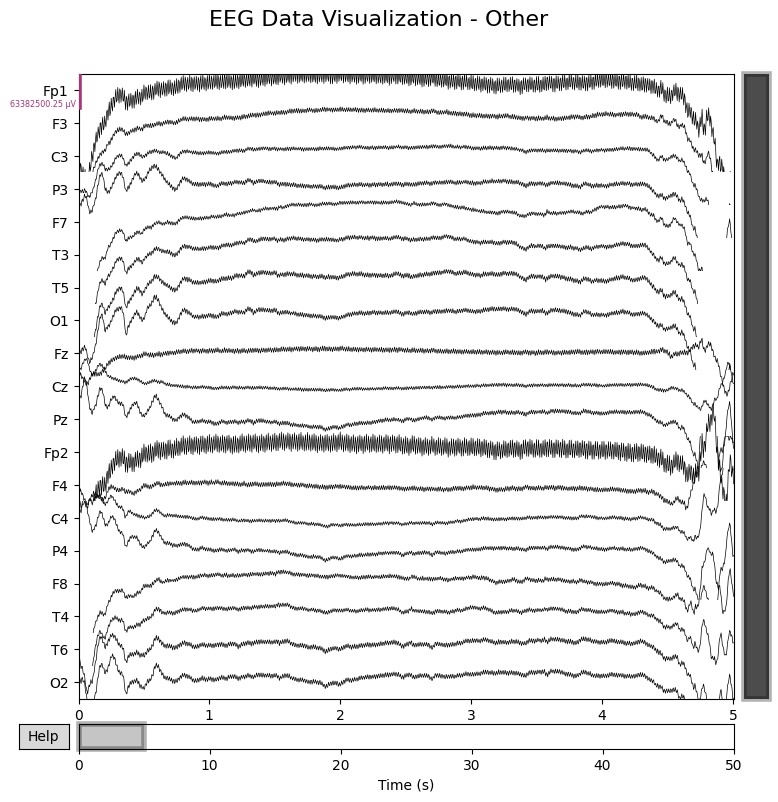

<Info | 7 non-empty values
 bads: []
 ch_names: Fp1, F3, C3, P3, F7, T3, T5, O1, Fz, Cz, Pz, Fp2, F4, C4, P4, ...
 chs: 19 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 100.0 Hz
 meas_date: unspecified
 nchan: 19
 projs: []
 sfreq: 200.0 Hz
>
Creating RawArray with float64 data, n_channels=19, n_times=16400
    Range : 0 ... 16399 =      0.000 ...    81.995 secs
Ready.


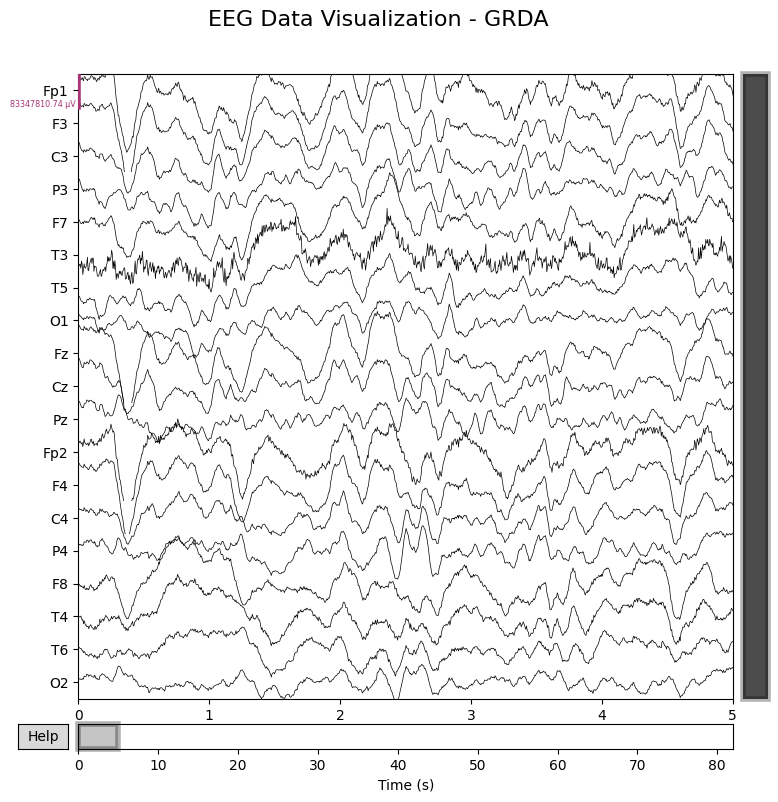

<Info | 7 non-empty values
 bads: []
 ch_names: Fp1, F3, C3, P3, F7, T3, T5, O1, Fz, Cz, Pz, Fp2, F4, C4, P4, ...
 chs: 19 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 100.0 Hz
 meas_date: unspecified
 nchan: 19
 projs: []
 sfreq: 200.0 Hz
>
Creating RawArray with float64 data, n_channels=19, n_times=10000
    Range : 0 ... 9999 =      0.000 ...    49.995 secs
Ready.


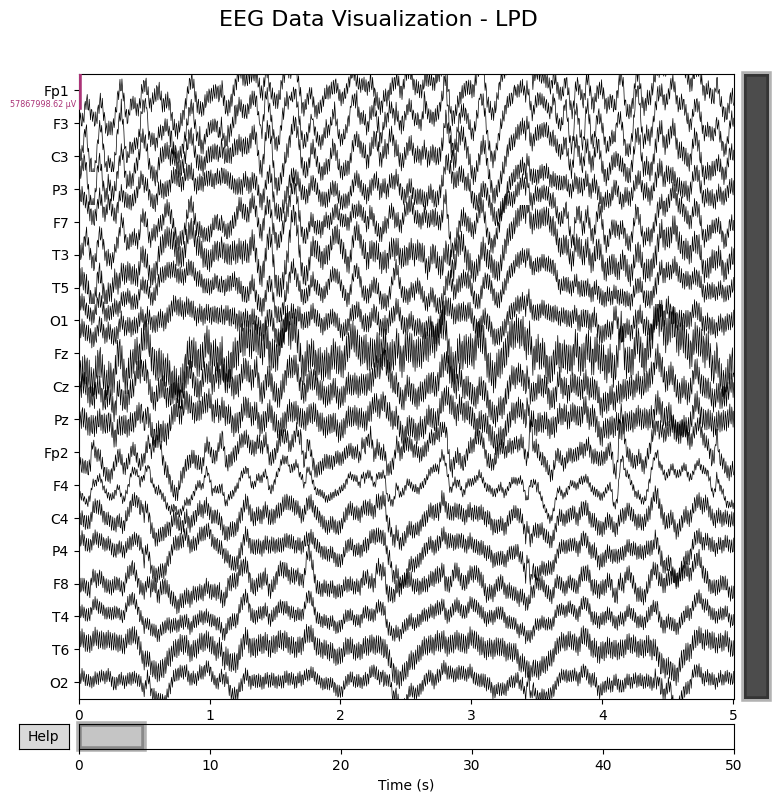

In [21]:
file_paths_by_category = {category: None for category in categories}

for category in categories:
    # Filtering the DataFrame for the current category
    filtered_df = train_df[train_df['expert_consensus'] == category]
    # Taking the first file path from the filtered DataFrame and storing it in the dictionary
    file_path = filtered_df.iloc[0]['eeg_file_path']
    file_paths_by_category[category] = file_path

def plot_eeg_for_each_category(file_paths_by_category):
  for category, file_path in file_paths_by_category.items():
      df = pd.read_parquet(file_path)
      eeg_data = df.drop(columns=['EKG']).to_numpy()
      channel_names = df.drop(columns=['EKG']).columns.tolist()
      sfreq = 200

      info = mne.create_info(channel_names, sfreq, ch_types='eeg')
      print(info)
      raw = mne.io.RawArray(eeg_data.T, info)
      fig = raw.plot(show=False, title='', duration=5, scalings='auto', n_channels=len(raw.ch_names))
      fig.subplots_adjust(top=0.9)
      fig.suptitle(f'EEG Data Visualization - {category}', fontsize=16)
      plt.show()

plot_eeg_for_each_category(file_paths_by_category)

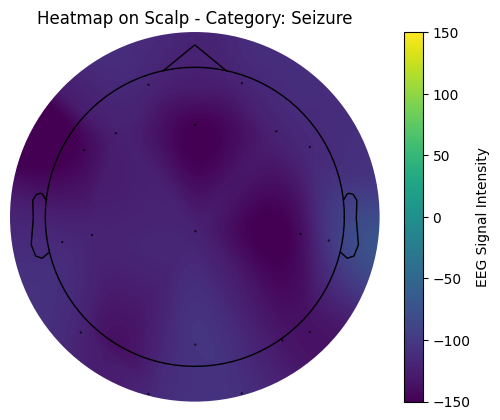

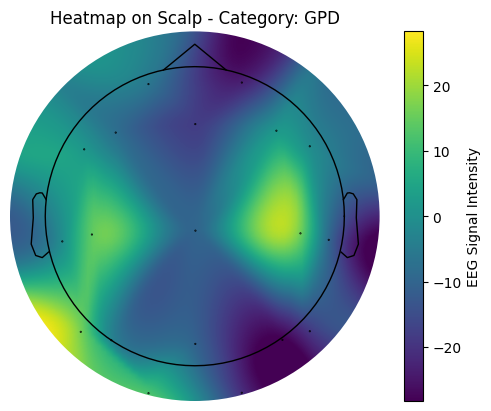

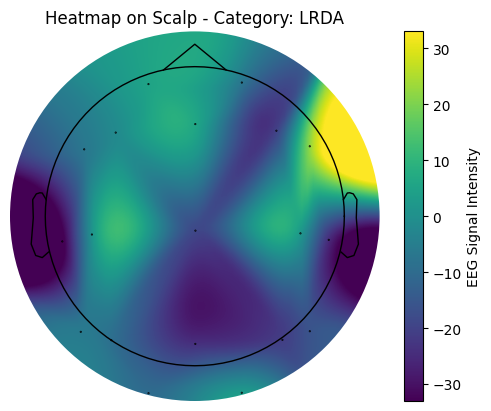

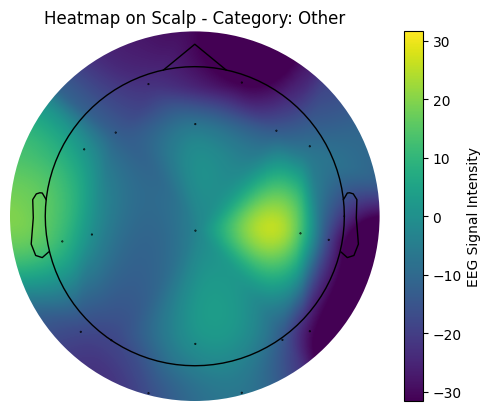

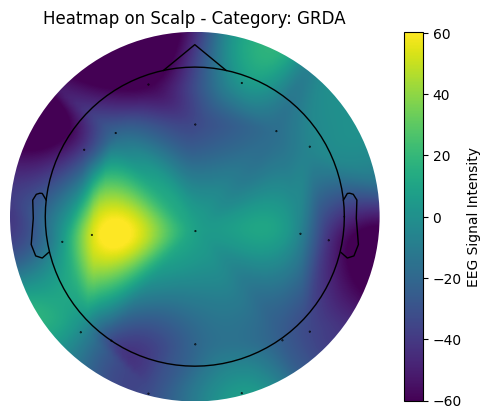

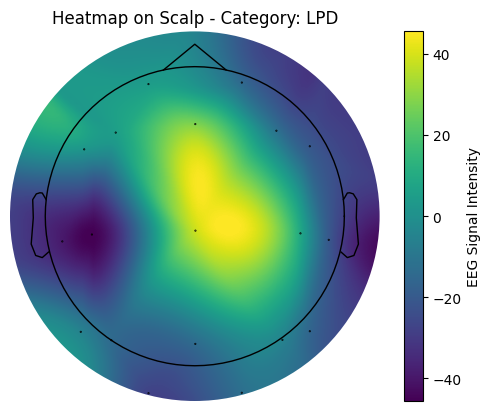

In [22]:
def plot_heatmap_for_one_file(file_paths_by_category):
  for category, file_path in file_paths_by_category.items():
    df = pd.read_parquet(file_path)
    electrode_names_df = df.drop(columns=['EKG']).columns.tolist()

    # Map electrode names in DataFrame to names in the montage
    electrode_names_mapped = [ch for ch in electrode_names_df if ch in MONTAGE.ch_names]
    electrode_values = df.drop(columns=['EKG']).values

    # Extract positions for mapped electrode names
    electrode_positions = MONTAGE.get_positions()
    xy_coords = np.array([electrode_positions['ch_pos'][ch][:2] for ch in electrode_names_mapped])

    # Plot the heatmap on the scalp for the first row of data
    fig, ax = plt.subplots()
    heatmap  = mne.viz.plot_topomap(electrode_values.mean(axis=0), xy_coords, axes=ax, cmap='viridis', show=False, contours=False)
    cbar = plt.colorbar(heatmap[0], ax=ax)
    cbar.set_label('EEG Signal Intensity')

    plt.title(f'Heatmap on Scalp - Category: {category}')
    plt.show()
plot_heatmap_for_one_file(file_paths_by_category)

These are the heatmaps generated from EEG data - Here we considered the first occurrence of any category and used the expert consensus in the same row for analysis.

Warmer colors (yellows, reds) usually indicate higher electrical activity or signal intensity.
Cooler colors (blues, purples) represent lower activity.


*   Seizure: The heatmap shows a very uniform color with very subtle variations in intensity, indicating low amplitude fluctuations across the scalp. The signal intensity scale goes from -150 to 150 µV, which may suggest broad but not highly localized activity typical of certain types of seizures.
*   GPD: This heatmap has more variation with localized regions of increased activity, indicated by the yellow and green areas. The signal intensity scale is much narrower, from -20 to 20 µV, which suggests a less intense activity than the seizure category.
*   LRDA: Here, the activity is also more localized than in the seizure category, with the signal intensity ranging from -30 to 30 µV. The activity is lateralized, meaning it is predominantly on one side, which is characteristic of LRDA.
*   Other: This category represents a type of activity that does not fit into the other specified categories.
*   GRDA: Similar to LRDA, GRDA indicates rhythmic delta activity, but it's generalized across the scalp rather than being lateralized. The scale shows a range from -60 to 60 µV, and there are two main areas of increased activity.
*   LPD: This heatmap shows very defined areas of increased activity that are lateralized, typically characteristic of LPD. The range is from -60 to 40 µV, indicating significant variability in the localized brain regions.

**Comparing the Heatmaps:**


*   Scale Variations: The intensity scales vary, indicating different amplitudes of EEG activity, which could correspond to the severity or type of the conditions.
*   Pattern Variations: Seizure activity tends to be more global and less localized than the other categories. In contrast, GPD, LRDA, GRDA, and LPD show localized hotspots, which suggests specific brain regions are more active or affected
*   Localization: LRDA and LPD indicate lateralized activity, while GRDA is generalized. GPD can be either localized or more generalized, and the 'Other' category is too nonspecific without additional context.

---

To refine the analysis and heatmap generation we will be performing the following operations on 50 subjects worth of data:

Group by eeg_file_path: Aggregate train_df by eeg_file_path.

Determine the Most Frequent expert_consensus: For each group, find the expert_consensus category that occurs most frequently and use it as the label for that EEG.

Merge the Determined Labels with EEG Data: Combine this information with your EEG measurement data from data, ensuring you're working with a subset of the first 50 subjects for this analysis.

Calculate Mean Values for Each Channel: For the EEG data of these subjects, calculate the mean values across all measurements for each channel.

Generate Heatmaps: Plot the heatmaps for each subject using the mean channel values.

In [23]:
most_frequent_consensus = train_df.groupby('eeg_file_path')['expert_consensus'].agg(lambda x: x.mode()[0]).reset_index()
most_frequent_consensus.rename(columns={'expert_consensus': 'consensus_label'}, inplace=True)

In [24]:

def plot_scalp_heatmaps_for_all_data(data):
    # Group by 'file_name' and calculate the mean of each group
    grouped_means = data.groupby('file_name').mean().reset_index()

    # Process file names for merging
    grouped_means['file_name_processed'] = grouped_means['file_name'].str.replace('/content/', '', regex=False)

    # Merge with most_frequent_consensus DataFrame
    final_eeg_df = pd.merge(grouped_means, most_frequent_consensus, left_on='file_name_processed', right_on='eeg_file_path', how='left')

    for category in final_eeg_df['consensus_label'].unique():
        # Filter the DataFrame for the current category
        category_df = final_eeg_df[final_eeg_df['consensus_label'] == category]

        # Calculate mean values for the category, excluding non-numeric columns
        mean_values = category_df.drop(columns=['EKG', 'file_name', 'file_name_processed', 'eeg_file_path', 'consensus_label']).mean(axis=0)

        # Map electrode names in DataFrame to names in the montage and filter out those not present
        electrode_names_mapped = [ch for ch in mean_values.index if ch in MONTAGE.ch_names]

        # Extract positions for mapped electrode names
        electrode_positions = MONTAGE.get_positions()
        xy_coords = np.array([electrode_positions['ch_pos'][ch][:2] for ch in electrode_names_mapped])

        # Extract mean values for the electrodes present in the montage
        values_for_plot = mean_values[electrode_names_mapped].values

        # Create the plot
        fig, ax = plt.subplots()
        heatmap = mne.viz.plot_topomap(values_for_plot, xy_coords, axes=ax, cmap='viridis', show=False, contours=False)
        cbar = plt.colorbar(heatmap[0], ax=ax)
        cbar.set_label('EEG Signal Intensity')

        plt.title(f'Heatmap on Scalp - Category: {category}')
        plt.show()

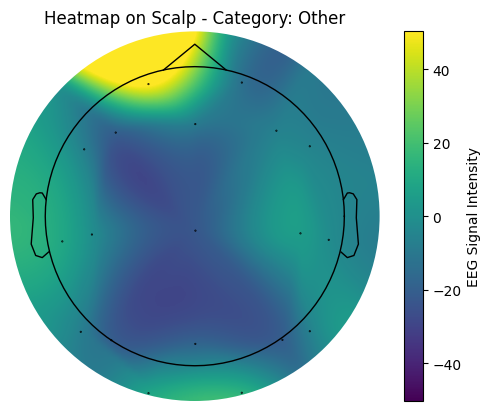

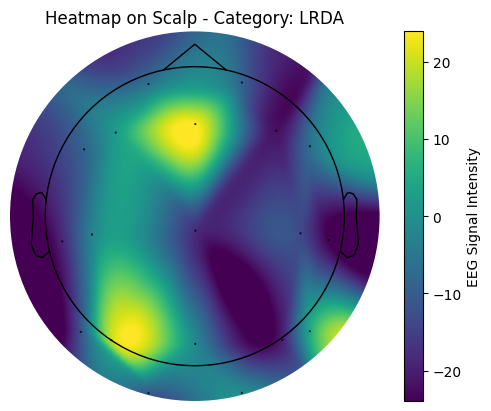

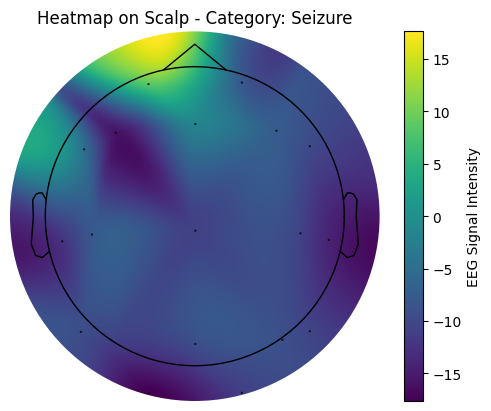

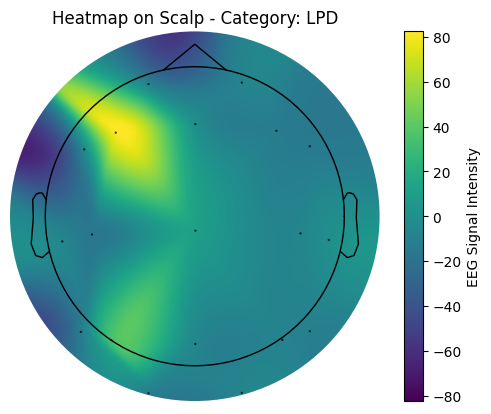

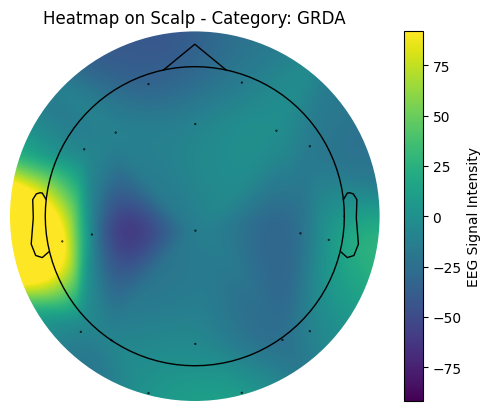

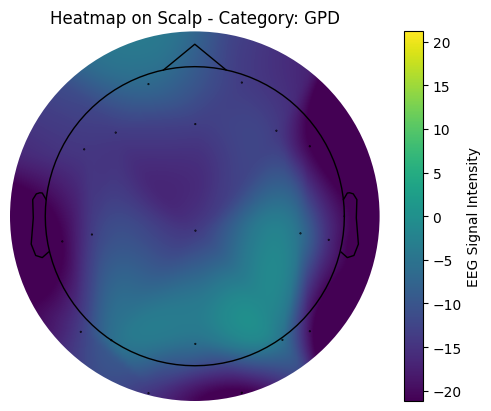

In [25]:
#Replace with full dataset
plot_scalp_heatmaps_for_all_data(data_50)

Second part: For 50 subjects worth of data
Here's a brief analysis of each category based on the heatmaps:



1.   Category: Other -
The distribution is relatively uniform, with a slight intensity increase at the top. This might indicate normal brain activity or a baseline EEG without specific focal features.
2.   Category: LRDA (Localized Rhythmic Delta Activity) -
There is a prominent area of increased intensity in the frontal region. LRDA often correlates with localized brain dysfunction, which could be reflected in the frontal lobe here.
3.   Category: Seizure -
Intense activity is observed at the top of the scalp. In the context of seizures, such a pattern could represent focal onset, with the possibility of the seizure activity spreading from that region.
4.   Category: LPD (Lateralized Periodic Discharges) -
This map shows a very focal area of high intensity, likely on the left side of the brain. LPDs are typically associated with acute or chronic focal brain dysfunction and can be observed in various clinical scenarios, including seizures.
5.   Category: GRDA (Generalized Rhythmic Delta Activity) -
The intensity is increased in the temporal regions, particularly on the right side. GRDA is often associated with widespread cerebral dysfunction and can sometimes be observed in encephalopathies or deep sleep stages.
6.   Category: GPD (Generalized Periodic Discharges) -
There's a generalized pattern with a mix of intensities, but without a clear focal point. GPDs can be seen in various clinical conditions and reflect a range of neural synchronization levels.

## Spectogram analysis

In [26]:
train_spec_files = os.listdir(spectrogram_dir)
print('Number of files in spectogram directory = ', len(train_spec_files))
# Print the first five filenames
for i in range(min(5, len(train_spec_files))):
    print(train_spec_files[i])

Number of files in spectogram directory =  11138
1103671260.parquet
528378048.parquet
1498491696.parquet
1801738451.parquet
709413561.parquet


The spectogram file has 1136 rows and 401 columns. The column names indicate the frequency in hertz and the recording regions of the EEG electrodes.


*   LL = left lateral
*   RL = right lateral
*   LP = left parasagittal
*   RP = right parasagittal


 LL = left lateral; RL = right lateral; LP = left parasagittal; RP = right parasagittal.

In [27]:
spec_example_df = pd.read_parquet("train_spectrograms/1812705163.parquet")
spec_example_df

,time,LL_0.59,LL_0.78,LL_0.98,LL_1.17,LL_1.37,LL_1.56,LL_1.76,LL_1.95,LL_2.15,...,RP_18.16,RP_18.36,RP_18.55,RP_18.75,RP_18.95,RP_19.14,RP_19.34,RP_19.53,RP_19.73,RP_19.92
0,1,52.759998,56.660000,59.459999,56.610001,91.330002,95.750000,93.570000,81.580002,47.349998,...,7.99,4.92,3.97,4.71,4.00,5.33,4.90,3.48,4.48,5.17
1,3,81.099998,81.059998,75.870003,115.250000,145.990005,145.929993,140.839996,128.160004,58.619999,...,5.82,2.75,2.35,2.67,3.61,5.35,3.85,6.74,7.09,4.13
2,5,109.660004,114.610001,171.130005,129.970001,134.089996,172.279999,154.610001,111.089996,92.930000,...,4.05,3.86,6.05,5.99,6.16,6.18,5.87,5.01,4.72,3.29
3,7,86.190002,90.209999,85.150002,52.619999,54.880001,59.619999,54.950001,59.240002,145.229996,...,13.89,12.23,10.32,10.34,9.88,5.19,4.14,3.45,2.19,2.10
4,9,112.209999,119.699997,124.370003,115.040001,42.919998,51.810001,55.040001,35.799999,124.459999,...,8.40,8.23,8.77,8.00,7.31,4.84,5.74,2.30,2.12,1.67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1131,2263,215.720001,187.339996,232.289993,229.800003,69.709999,66.519997,29.760000,27.230000,37.029999,...,0.86,0.88,0.84,1.35,1.42,1.34,1.24,1.03,0.47,0.57
1132,2265,162.289993,194.809998,197.500000,165.740005,82.029999,38.189999,27.330000,23.920000,15.590000,...,1.37,1.24,0.81,0.94,1.01,0.94,1.26,1.17,0.96,1.38
1133,2267,136.240005,167.600006,223.179993,99.769997,98.589996,48.169998,29.379999,23.580000,18.049999,...,1.67,1.76,2.06,1.43,1.06,1.20,2.83,2.78,2.96,3.12
1134,2269,204.300003,258.880005,239.330002,193.880005,146.720001,55.470001,44.849998,52.299999,54.490002,...,1.68,2.11,1.71,1.90,1.98,1.14,2.14,2.10,2.22,2.26


In [28]:
unique_spec_id = train_df['spectrogram_id'].nunique()
print("Number of unique spectograms", unique_spec_id)

Number of unique spectograms 11138


Nuber of files in spectogram directory =  11138 and the number of unique spectogram ids = 11138. So there is no duplication and each file is unique.

Category: Seizure
LL Columns: ['LL_0.59', 'LL_0.78', 'LL_0.98', 'LL_1.17', 'LL_1.37', 'LL_1.56', 'LL_1.76', 'LL_1.95', 'LL_2.15', 'LL_2.34', 'LL_2.54', 'LL_2.73', 'LL_2.93', 'LL_3.13', 'LL_3.32', 'LL_3.52', 'LL_3.71', 'LL_3.91', 'LL_4.1', 'LL_4.3', 'LL_4.49', 'LL_4.69', 'LL_4.88', 'LL_5.08', 'LL_5.27', 'LL_5.47', 'LL_5.66', 'LL_5.86', 'LL_6.05', 'LL_6.25', 'LL_6.45', 'LL_6.64', 'LL_6.84', 'LL_7.03', 'LL_7.23', 'LL_7.42', 'LL_7.62', 'LL_7.81', 'LL_8.01', 'LL_8.2', 'LL_8.4', 'LL_8.59', 'LL_8.79', 'LL_8.98', 'LL_9.18', 'LL_9.38', 'LL_9.57', 'LL_9.77', 'LL_9.96', 'LL_10.16', 'LL_10.35', 'LL_10.55', 'LL_10.74', 'LL_10.94', 'LL_11.13', 'LL_11.33', 'LL_11.52', 'LL_11.72', 'LL_11.91', 'LL_12.11', 'LL_12.3', 'LL_12.5', 'LL_12.7', 'LL_12.89', 'LL_13.09', 'LL_13.28', 'LL_13.48', 'LL_13.67', 'LL_13.87', 'LL_14.06', 'LL_14.26', 'LL_14.45', 'LL_14.65', 'LL_14.84', 'LL_15.04', 'LL_15.23', 'LL_15.43', 'LL_15.63', 'LL_15.82', 'LL_16.02', 'LL_16.21', 'LL_16.41', 'LL_16.6', 'LL_16.8', 'LL_16.99', 'LL_17.

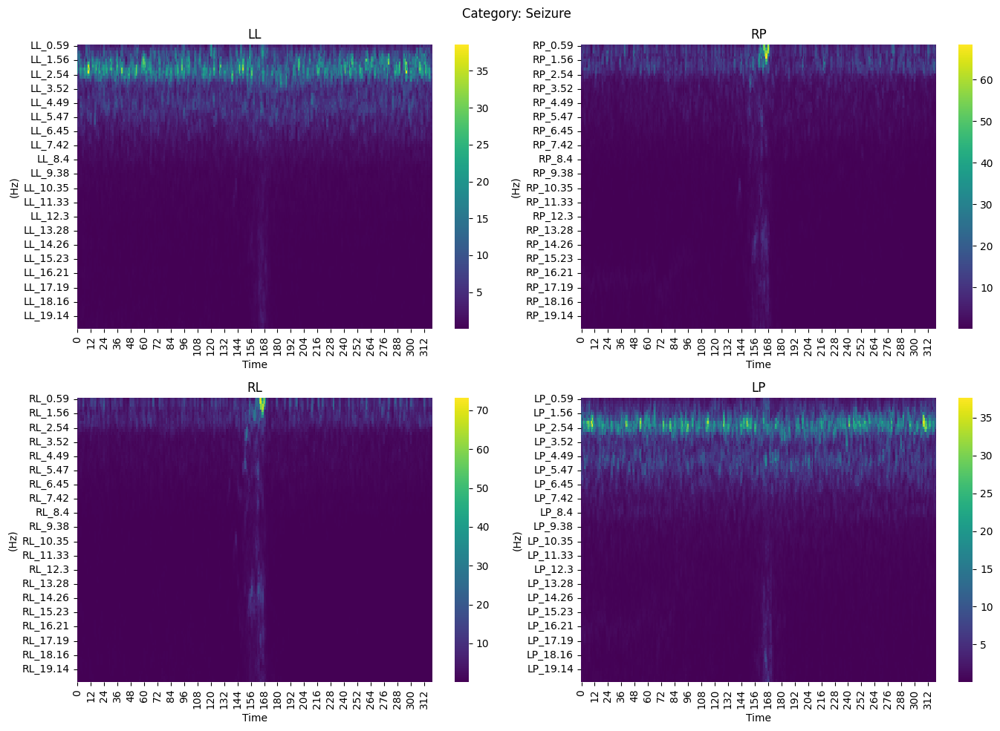

Category: GPD
LL Columns: ['LL_0.59', 'LL_0.78', 'LL_0.98', 'LL_1.17', 'LL_1.37', 'LL_1.56', 'LL_1.76', 'LL_1.95', 'LL_2.15', 'LL_2.34', 'LL_2.54', 'LL_2.73', 'LL_2.93', 'LL_3.13', 'LL_3.32', 'LL_3.52', 'LL_3.71', 'LL_3.91', 'LL_4.1', 'LL_4.3', 'LL_4.49', 'LL_4.69', 'LL_4.88', 'LL_5.08', 'LL_5.27', 'LL_5.47', 'LL_5.66', 'LL_5.86', 'LL_6.05', 'LL_6.25', 'LL_6.45', 'LL_6.64', 'LL_6.84', 'LL_7.03', 'LL_7.23', 'LL_7.42', 'LL_7.62', 'LL_7.81', 'LL_8.01', 'LL_8.2', 'LL_8.4', 'LL_8.59', 'LL_8.79', 'LL_8.98', 'LL_9.18', 'LL_9.38', 'LL_9.57', 'LL_9.77', 'LL_9.96', 'LL_10.16', 'LL_10.35', 'LL_10.55', 'LL_10.74', 'LL_10.94', 'LL_11.13', 'LL_11.33', 'LL_11.52', 'LL_11.72', 'LL_11.91', 'LL_12.11', 'LL_12.3', 'LL_12.5', 'LL_12.7', 'LL_12.89', 'LL_13.09', 'LL_13.28', 'LL_13.48', 'LL_13.67', 'LL_13.87', 'LL_14.06', 'LL_14.26', 'LL_14.45', 'LL_14.65', 'LL_14.84', 'LL_15.04', 'LL_15.23', 'LL_15.43', 'LL_15.63', 'LL_15.82', 'LL_16.02', 'LL_16.21', 'LL_16.41', 'LL_16.6', 'LL_16.8', 'LL_16.99', 'LL_17.19',

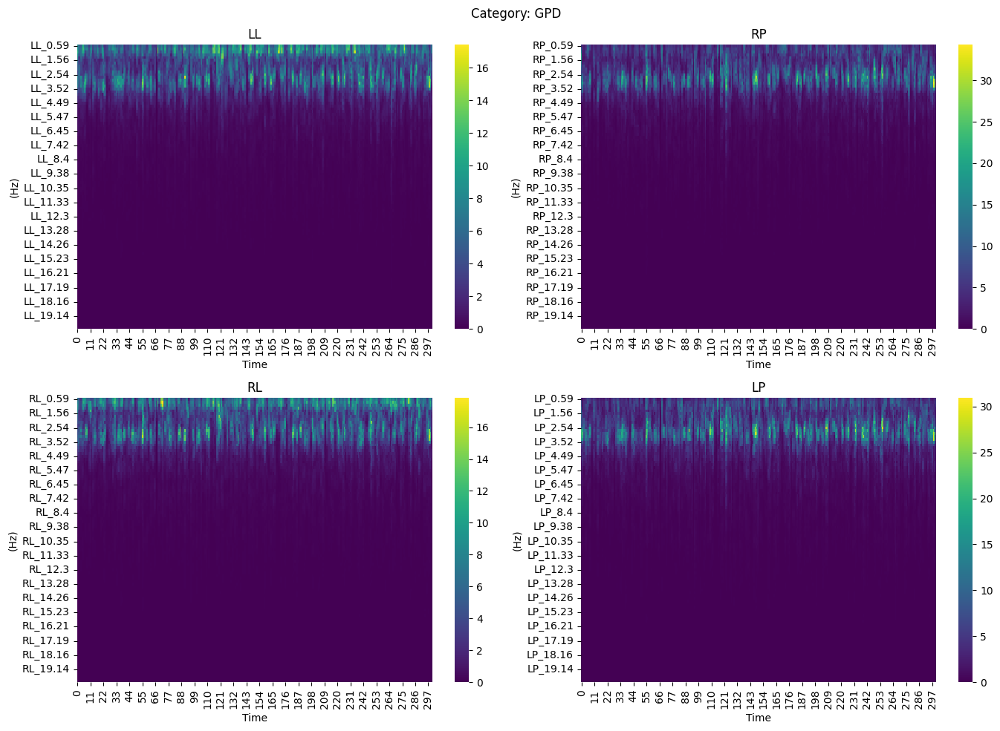

Category: LRDA
LL Columns: ['LL_0.59', 'LL_0.78', 'LL_0.98', 'LL_1.17', 'LL_1.37', 'LL_1.56', 'LL_1.76', 'LL_1.95', 'LL_2.15', 'LL_2.34', 'LL_2.54', 'LL_2.73', 'LL_2.93', 'LL_3.13', 'LL_3.32', 'LL_3.52', 'LL_3.71', 'LL_3.91', 'LL_4.1', 'LL_4.3', 'LL_4.49', 'LL_4.69', 'LL_4.88', 'LL_5.08', 'LL_5.27', 'LL_5.47', 'LL_5.66', 'LL_5.86', 'LL_6.05', 'LL_6.25', 'LL_6.45', 'LL_6.64', 'LL_6.84', 'LL_7.03', 'LL_7.23', 'LL_7.42', 'LL_7.62', 'LL_7.81', 'LL_8.01', 'LL_8.2', 'LL_8.4', 'LL_8.59', 'LL_8.79', 'LL_8.98', 'LL_9.18', 'LL_9.38', 'LL_9.57', 'LL_9.77', 'LL_9.96', 'LL_10.16', 'LL_10.35', 'LL_10.55', 'LL_10.74', 'LL_10.94', 'LL_11.13', 'LL_11.33', 'LL_11.52', 'LL_11.72', 'LL_11.91', 'LL_12.11', 'LL_12.3', 'LL_12.5', 'LL_12.7', 'LL_12.89', 'LL_13.09', 'LL_13.28', 'LL_13.48', 'LL_13.67', 'LL_13.87', 'LL_14.06', 'LL_14.26', 'LL_14.45', 'LL_14.65', 'LL_14.84', 'LL_15.04', 'LL_15.23', 'LL_15.43', 'LL_15.63', 'LL_15.82', 'LL_16.02', 'LL_16.21', 'LL_16.41', 'LL_16.6', 'LL_16.8', 'LL_16.99', 'LL_17.19'

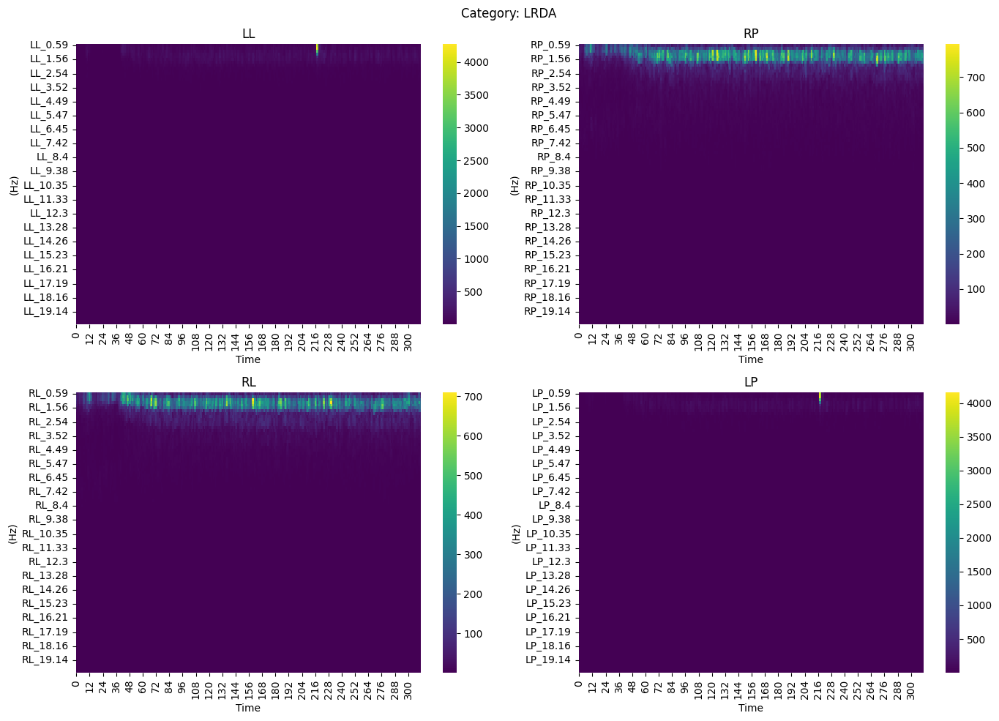

Category: Other
LL Columns: ['LL_0.59', 'LL_0.78', 'LL_0.98', 'LL_1.17', 'LL_1.37', 'LL_1.56', 'LL_1.76', 'LL_1.95', 'LL_2.15', 'LL_2.34', 'LL_2.54', 'LL_2.73', 'LL_2.93', 'LL_3.13', 'LL_3.32', 'LL_3.52', 'LL_3.71', 'LL_3.91', 'LL_4.1', 'LL_4.3', 'LL_4.49', 'LL_4.69', 'LL_4.88', 'LL_5.08', 'LL_5.27', 'LL_5.47', 'LL_5.66', 'LL_5.86', 'LL_6.05', 'LL_6.25', 'LL_6.45', 'LL_6.64', 'LL_6.84', 'LL_7.03', 'LL_7.23', 'LL_7.42', 'LL_7.62', 'LL_7.81', 'LL_8.01', 'LL_8.2', 'LL_8.4', 'LL_8.59', 'LL_8.79', 'LL_8.98', 'LL_9.18', 'LL_9.38', 'LL_9.57', 'LL_9.77', 'LL_9.96', 'LL_10.16', 'LL_10.35', 'LL_10.55', 'LL_10.74', 'LL_10.94', 'LL_11.13', 'LL_11.33', 'LL_11.52', 'LL_11.72', 'LL_11.91', 'LL_12.11', 'LL_12.3', 'LL_12.5', 'LL_12.7', 'LL_12.89', 'LL_13.09', 'LL_13.28', 'LL_13.48', 'LL_13.67', 'LL_13.87', 'LL_14.06', 'LL_14.26', 'LL_14.45', 'LL_14.65', 'LL_14.84', 'LL_15.04', 'LL_15.23', 'LL_15.43', 'LL_15.63', 'LL_15.82', 'LL_16.02', 'LL_16.21', 'LL_16.41', 'LL_16.6', 'LL_16.8', 'LL_16.99', 'LL_17.19

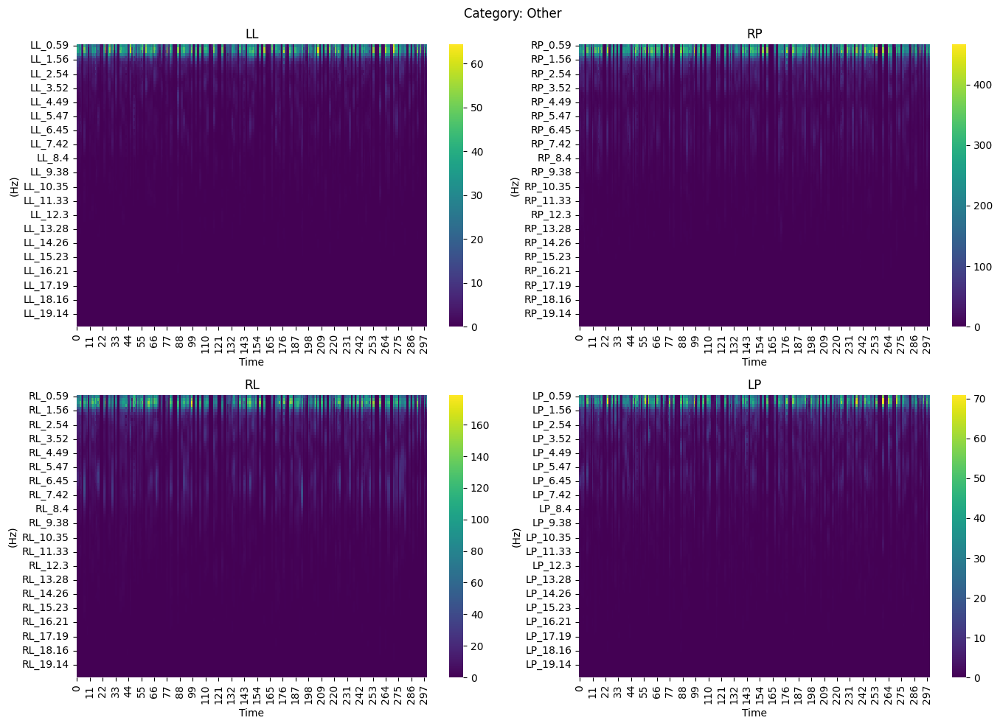

Category: GRDA
LL Columns: ['LL_0.59', 'LL_0.78', 'LL_0.98', 'LL_1.17', 'LL_1.37', 'LL_1.56', 'LL_1.76', 'LL_1.95', 'LL_2.15', 'LL_2.34', 'LL_2.54', 'LL_2.73', 'LL_2.93', 'LL_3.13', 'LL_3.32', 'LL_3.52', 'LL_3.71', 'LL_3.91', 'LL_4.1', 'LL_4.3', 'LL_4.49', 'LL_4.69', 'LL_4.88', 'LL_5.08', 'LL_5.27', 'LL_5.47', 'LL_5.66', 'LL_5.86', 'LL_6.05', 'LL_6.25', 'LL_6.45', 'LL_6.64', 'LL_6.84', 'LL_7.03', 'LL_7.23', 'LL_7.42', 'LL_7.62', 'LL_7.81', 'LL_8.01', 'LL_8.2', 'LL_8.4', 'LL_8.59', 'LL_8.79', 'LL_8.98', 'LL_9.18', 'LL_9.38', 'LL_9.57', 'LL_9.77', 'LL_9.96', 'LL_10.16', 'LL_10.35', 'LL_10.55', 'LL_10.74', 'LL_10.94', 'LL_11.13', 'LL_11.33', 'LL_11.52', 'LL_11.72', 'LL_11.91', 'LL_12.11', 'LL_12.3', 'LL_12.5', 'LL_12.7', 'LL_12.89', 'LL_13.09', 'LL_13.28', 'LL_13.48', 'LL_13.67', 'LL_13.87', 'LL_14.06', 'LL_14.26', 'LL_14.45', 'LL_14.65', 'LL_14.84', 'LL_15.04', 'LL_15.23', 'LL_15.43', 'LL_15.63', 'LL_15.82', 'LL_16.02', 'LL_16.21', 'LL_16.41', 'LL_16.6', 'LL_16.8', 'LL_16.99', 'LL_17.19'

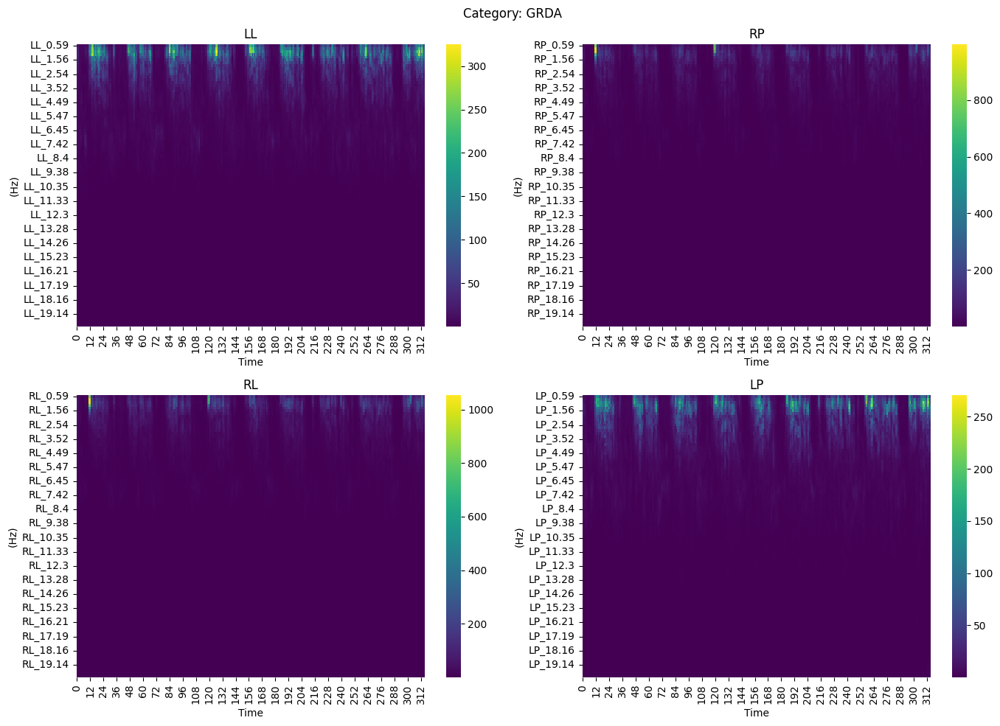

Category: LPD
LL Columns: ['LL_0.59', 'LL_0.78', 'LL_0.98', 'LL_1.17', 'LL_1.37', 'LL_1.56', 'LL_1.76', 'LL_1.95', 'LL_2.15', 'LL_2.34', 'LL_2.54', 'LL_2.73', 'LL_2.93', 'LL_3.13', 'LL_3.32', 'LL_3.52', 'LL_3.71', 'LL_3.91', 'LL_4.1', 'LL_4.3', 'LL_4.49', 'LL_4.69', 'LL_4.88', 'LL_5.08', 'LL_5.27', 'LL_5.47', 'LL_5.66', 'LL_5.86', 'LL_6.05', 'LL_6.25', 'LL_6.45', 'LL_6.64', 'LL_6.84', 'LL_7.03', 'LL_7.23', 'LL_7.42', 'LL_7.62', 'LL_7.81', 'LL_8.01', 'LL_8.2', 'LL_8.4', 'LL_8.59', 'LL_8.79', 'LL_8.98', 'LL_9.18', 'LL_9.38', 'LL_9.57', 'LL_9.77', 'LL_9.96', 'LL_10.16', 'LL_10.35', 'LL_10.55', 'LL_10.74', 'LL_10.94', 'LL_11.13', 'LL_11.33', 'LL_11.52', 'LL_11.72', 'LL_11.91', 'LL_12.11', 'LL_12.3', 'LL_12.5', 'LL_12.7', 'LL_12.89', 'LL_13.09', 'LL_13.28', 'LL_13.48', 'LL_13.67', 'LL_13.87', 'LL_14.06', 'LL_14.26', 'LL_14.45', 'LL_14.65', 'LL_14.84', 'LL_15.04', 'LL_15.23', 'LL_15.43', 'LL_15.63', 'LL_15.82', 'LL_16.02', 'LL_16.21', 'LL_16.41', 'LL_16.6', 'LL_16.8', 'LL_16.99', 'LL_17.19',

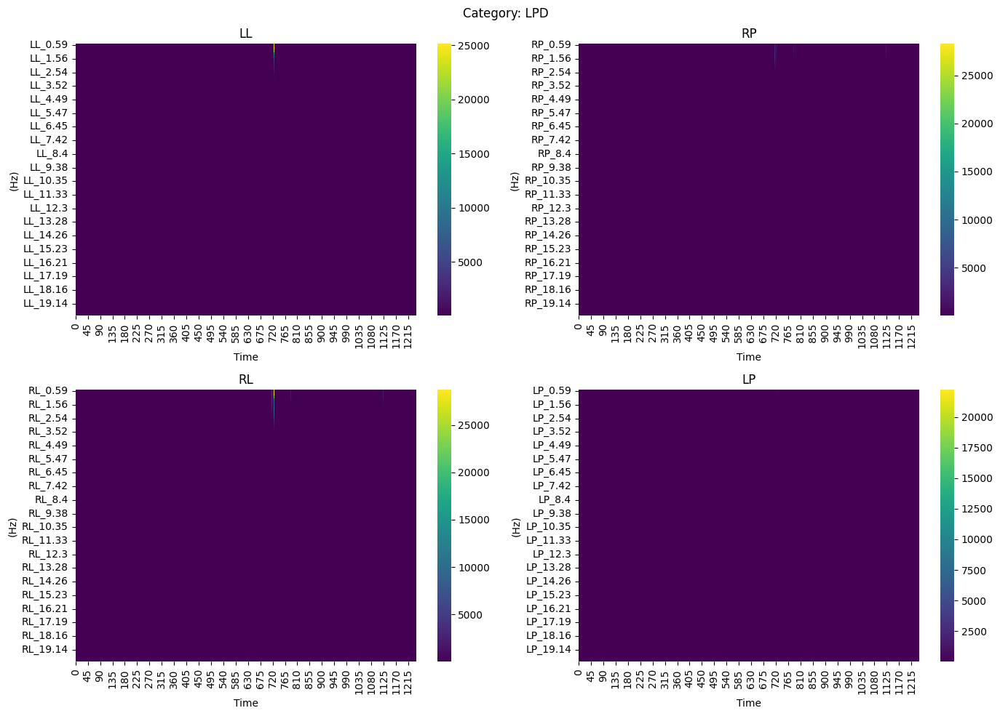

In [29]:
def set_axes(ax, data, title):
    sns.heatmap(data.T, ax=ax, cmap='viridis', cbar=True)
    ax.set_title(title)
    ax.set_xlabel('Time', size=10)
    ax.set_ylabel('(Hz)', size=10)


for category in categories:
    # Filtering the DataFrame for the current category
    filtered_df = train_df[train_df['expert_consensus'] == category]
    # Taking the first file path from the filtered DataFrame and storing it in the dictionary
    file_path = filtered_df.iloc[0]['spectrogram_file_path']
    df = pd.read_parquet(file_path)

    # Select columns starting with "^LL", "RL", "RP", and "LP"
    ll_columns = [col for col in df.columns if col.startswith('LL')]
    rl_columns = [col for col in df.columns if col.startswith('RL')]
    rp_columns = [col for col in df.columns if col.startswith('RP')]
    lp_columns = [col for col in df.columns if col.startswith('LP')]

    # Plot heatmaps for each column group
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))

    print(f"Category: {category}")
    print(f"LL Columns: {ll_columns}")
    print(f"RL Columns: {rl_columns}")
    print(f"RP Columns: {rp_columns}")
    print(f"LP Columns: {lp_columns}")

    set_axes(axes[0, 0], df[ll_columns], 'LL')
    set_axes(axes[1, 0], df[rl_columns], 'RL')
    set_axes(axes[0, 1], df[rp_columns], 'RP')
    set_axes(axes[1, 1], df[lp_columns], 'LP')

    fig.suptitle(f'Category: {category}')
    plt.tight_layout()
    plt.show()

**General Observations**
Each heatmap represents spectral data over time, with different frequency components plotted against time intervals.
There are four heatmaps per category,  representing different channels or data streams labeled LL (Lower Left), RL (Lower Right), RP (Upper Right), and LP (Upper Left).
Each heatmap has a color scale indicating the magnitude of the spectral components, with purple indicating lower values and yellow higher values.

**Specific Observations**


1.   Category: LPD -
The LL and RP heatmaps show a nearly uniform distribution without significant variations over time.
RL and LP heatmaps also display uniformity, but there seems to be a slight variance with yellow lines indicating some events or noise.
2.   Category: GRDA -
These heatmaps are rich in detail, with the frequency components varying significantly over time.
The yellow and cyan streaks indicate periods with higher magnitude frequency components, suggesting activity at specific times.
3.   Category: Other -
This category shows a very distinct pattern with almost consistent lines across all channels, indicating regular occurrences or periodic events.
4.   Category: LRDA -
These heatmaps seem to show sparse activity with some isolated peaks, possibly indicating infrequent or transient events.
5.   Category: GPD -
The patterns here suggest sporadic activity with periods of higher frequency components.
The LL heatmap appears to have less activity compared to the others.
6.   Category: Seizure
The heatmaps show irregular patterns of spectral activity, which may correspond to the unpredictable nature of seizures.


**Summary** :
*   Stability: The LPD category shows stable conditions, possibly a baseline or control state.
*   Activity: GRDA and GPD categories exhibit more active states with distinct spectral events.
*   Periodicity: The "Other" category has regular and periodic patterns.
Transience: LRDA shows transient spectral events.
*   Irregularity: Seizure category likely represents pathological or irregular brain activity, given the nature of the data and the labeling.

The presence of yellow and other lighter colors near near the lower frequencies on the heatmap suggests more activity or higher magnitudes at these lower frequencies.


---


**Conclusion: We can eliminate the columns that have higher frequencies in order to reduce dimensionality**

---

## Train metadata file
**train.csv provides the metadata that allows you to extract the original subsets that the raters annotated.**
The column names indicate the frequency in hertz and the recording regions of the EEG electrodes. The latter are abbreviated as LL = left lateral; RL = right lateral; LP = left parasagittal; RP = right parasagittal.


*   eeg_id - A unique identifier for the entire EEG recording.

*   eeg_sub_id - An ID for the specific 50 second long subsample this row's labels apply to.

*   eeg_label_offset_seconds - The time between the beginning of the consolidated EEG and this subsample.

*   spectrogram_id - A unique identifier for the entire EEG recording.
*   spectrogram_sub_id - An ID for the specific 10 minute subsample this row's labels apply to.

*   spectogram_label_offset_seconds - The time between the beginning of the consolidated spectrogram and this subsample.

*   patient_id - An ID for the patient who donated the data.

*   expert_consensus - The consensus annotator label. Provided for convenience only.

*   [seizure/lpd/gpd/lrda/grda/other]_vote - The count of annotator votes for a given brain activity class.

In [30]:
patients = train_df['patient_id'].unique()
print("Total number of patients =", len(patients))
print(patients)

Total number of patients = 1950
[42516 30539 56885 ...   200  5149  7118]


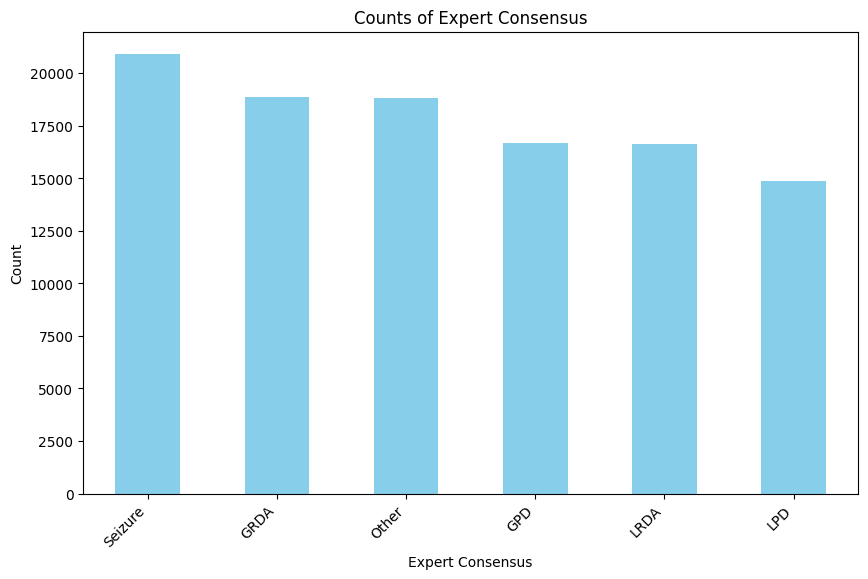

In [31]:
def count_targets(train_df):
  # Count the occurrences of each unique value in the 'expert_consensus' column
  consensus_counts = train_df['expert_consensus'].value_counts()

  plt.figure(figsize=(10, 6))
  consensus_counts.plot(kind='bar', color='skyblue')
  plt.title('Counts of Expert Consensus')
  plt.xlabel('Expert Consensus')
  plt.ylabel('Count')
  plt.xticks(rotation=45, ha='right')
  plt.show()

count_targets(train_df)


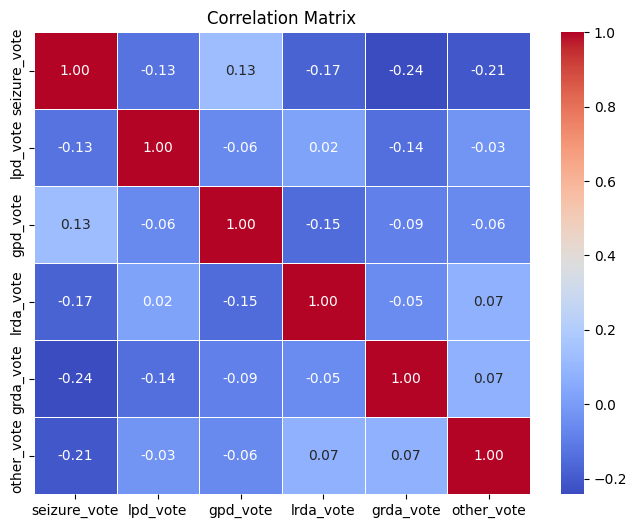

In [32]:
correlation_matrix = train_df[TARGETS].corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

From the correlation matrix above for the vote columns we can observe that other_vote, grda_vote and lrda_vote have significant correlation

In [33]:
unique_patient_ids_per_eeg = train_df.groupby('eeg_id')['patient_id'].nunique()

# Find 'eeg_id's with more than one 'patient_id' associated
ids = unique_patient_ids_per_eeg[unique_patient_ids_per_eeg > 1]

if len(ids) > 0:
    print("There are EEG IDs which have more than one patients")
else:
    print("Each unique EEG ID is associated with the same patient ID consistently.")

Each unique EEG ID is associated with the same patient ID consistently.


verify if each patient can have different eeg_ids in the dataset

In [34]:
unique_eeg_ids_per_patient = train_df.groupby('patient_id')['eeg_id'].nunique()
ids = unique_eeg_ids_per_patient[unique_eeg_ids_per_patient > 1]

if len(ids) > 0:
    print("There are patients associated with more than one EEG ID:")
else:
    print("Each patient is associated with only one EEG ID.")

There are patients associated with more than one EEG ID:


# Labelling

In [40]:
import pandas as pd
import numpy as np

# Define the function to make EEG labels for overlapping 15-second data
def make_eeg_labels_for_overlapping_15_sec_data(row, data_50):
    eeg = data_50[data_50['eeg_id'] == row.eeg_id]
    eeg_offset = int(row.eeg_label_offset_seconds)

    # Fill NaNs in numeric columns only
    numeric_columns = eeg.select_dtypes(include=[np.number]).columns
    eeg[numeric_columns] = eeg[numeric_columns].fillna(eeg[numeric_columns].mean())

    # Extract the central 15-second data from the specified 50-second window
    start_offset = eeg_offset * 200 + 3500  # Adding 3500 to skip to the central 15-second segment start
    end_offset = start_offset + 3000  # 3000 samples for 15 seconds
    eeg = eeg.iloc[start_offset:end_offset]

    # Add additional columns from 'row' to the extracted segment of EEG data
    columns_to_add = ['eeg_id', 'spectrogram_id', 'spectrogram_label_offset_seconds', 'patient_id',
                      'seizure_vote', 'gpd_vote', 'lrda_vote', 'lpd_vote', 'grda_vote', 'other_vote', 'expert_consensus']
    for column in columns_to_add:
        eeg[column] = row[column]

    return eeg

# Define the function to make labels
def make_labels(data_50, train_df):
    eeg_data_list = []
    data_50['eeg_id'] = data_50['file_name'].str.extract(r'(\d+).parquet')[0].astype(int)

    for eeg_id in data_50['eeg_id'].unique():
        rows = train_df[train_df['eeg_id'] == eeg_id]
        results = [make_eeg_labels_for_overlapping_15_sec_data(row, data_50) for _, row in rows.iterrows()]
        eeg_data_for_id = pd.concat(results, ignore_index=True)
        eeg_data_list.append(eeg_data_for_id)

    eeg_data_15 = pd.concat(eeg_data_list, ignore_index=True)

    # Normalize targets - probability distribution
    TARGETS = ['seizure_vote', 'gpd_vote', 'lrda_vote', 'lpd_vote', 'grda_vote', 'other_vote']
    y_data = eeg_data_15[TARGETS].values
    y_data = y_data / y_data.sum(axis=1, keepdims=True)
    eeg_data_15[TARGETS] = y_data

    return eeg_data_15


In [41]:
eeg_data_15 = make_labels(data_50, train_df)

<ipython-input-40-b31f21869f16>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eeg[numeric_columns] = eeg[numeric_columns].fillna(eeg[numeric_columns].mean())
<ipython-input-40-b31f21869f16>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eeg[numeric_columns] = eeg[numeric_columns].fillna(eeg[numeric_columns].mean())
<ipython-input-40-b31f21869f16>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See

In [42]:
eeg_data_15

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,...,spectrogram_id,spectrogram_label_offset_seconds,patient_id,seizure_vote,gpd_vote,lrda_vote,lpd_vote,grda_vote,other_vote,expert_consensus
0,-12.34,-32.49,16.90,-9.56,-9.56,22.89,19.83,-10.84,-14.42,-18.71,...,1542630619,0.0,4312,0.0,0.0,0.000,0.0,0.333333,0.666667,Other
1,-25.99,-47.88,1.66,-24.29,-24.70,7.17,4.07,-27.34,-29.77,-34.27,...,1542630619,0.0,4312,0.0,0.0,0.000,0.0,0.333333,0.666667,Other
2,-19.95,-41.05,10.29,-14.45,-17.10,16.50,14.92,-22.31,-20.39,-24.33,...,1542630619,0.0,4312,0.0,0.0,0.000,0.0,0.333333,0.666667,Other
3,-25.71,-45.10,8.60,-17.61,-22.43,13.08,13.09,-19.44,-24.18,-28.14,...,1542630619,0.0,4312,0.0,0.0,0.000,0.0,0.333333,0.666667,Other
4,-24.20,-46.51,6.77,-20.35,-24.63,9.24,6.28,-21.94,-23.94,-28.20,...,1542630619,0.0,4312,0.0,0.0,0.000,0.0,0.333333,0.666667,Other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
653995,-164.29,-104.74,-21.27,34.29,-105.80,-42.80,-25.25,-20.20,-94.37,-45.19,...,402751423,0.0,20230,0.0,0.0,0.125,0.0,0.062500,0.812500,Other
653996,-139.83,-88.26,5.05,55.29,-96.50,-11.17,-2.66,-2.66,-73.90,-27.12,...,402751423,0.0,20230,0.0,0.0,0.125,0.0,0.062500,0.812500,Other
653997,-153.39,-121.22,-22.60,36.42,-105.27,-43.07,-19.41,-19.41,-81.35,-42.27,...,402751423,0.0,20230,0.0,0.0,0.125,0.0,0.062500,0.812500,Other
653998,-167.74,-124.15,-14.89,45.99,-120.96,-28.18,-10.37,-9.84,-77.62,-35.09,...,402751423,0.0,20230,0.0,0.0,0.125,0.0,0.062500,0.812500,Other


In [46]:
eeg_data_15.dtypes

Fp1                                 float64
F3                                  float64
C3                                  float64
P3                                  float64
F7                                  float64
T3                                  float64
T5                                  float64
O1                                  float64
Fz                                  float64
Cz                                  float64
Pz                                  float64
Fp2                                 float64
F4                                  float64
C4                                  float64
P4                                  float64
F8                                  float64
T4                                  float64
T6                                  float64
O2                                  float64
EKG                                 float64
file_name                            object
eeg_id                                int64
spectrogram_id                  

In [54]:
def filter_data(target, data):
    return data[data['expert_consensus'] == target]

# Function to calculate statistics for EEG data
def calculate_stats_eeg(data):
    data = data.drop(['seizure_vote', 'lpd_vote', 'gpd_vote', 'lrda_vote',
                      'grda_vote', 'other_vote', 'eeg_id', 'spectrogram_id',
                      'spectrogram_label_offset_seconds', 'patient_id', 'EKG','file_name'], axis=1, errors='ignore')

    stats_dict = {}

    for target in categories:
        target_data = filter_data(target, data)
        target_data = target_data.drop(['expert_consensus'], axis =1)
        target_stats = target_data.describe()

        target_mean = target_stats.loc['mean']
        target_median = target_stats.loc['50%']  # Median
        target_std = target_stats.loc['std']
        target_var = target_stats.loc['std'] ** 2  # Variance
        target_kurtosis = target_data.kurtosis()
        target_skewness = target_data.skew()

        stats_dict[target] = {
            'mean': target_mean,
            'median': target_median,
            'std': target_std,
            'variance': target_var,
            'kurtosis': target_kurtosis,
            'skewness': target_skewness
        }

    return stats_dict


In [55]:
stats = calculate_stats_eeg(eeg_data_15)

In [56]:
stats['Seizure']['mean']

Fp1     8.962587
F3     -7.162825
C3     -1.076110
P3     -5.933633
F7     -0.731070
T3     -5.623833
T5     -3.564547
O1    -14.772635
Fz      7.874889
Cz      4.509729
Pz     -2.923270
Fp2    -3.259403
F4     -3.957872
C4     -0.297761
P4      3.897421
F8     -2.109423
T4     -7.528129
T6     -1.912386
O2      2.072663
Name: mean, dtype: float64

In [59]:
eeg_data_15.head()

,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,...,spectrogram_id,spectrogram_label_offset_seconds,patient_id,seizure_vote,gpd_vote,lrda_vote,lpd_vote,grda_vote,other_vote,expert_consensus
0,-12.34,-32.49,16.90,-9.56,-9.56,22.89,19.83,-10.84,-14.42,-18.71,...,1542630619,0.0,4312,0.0,0.0,0.0,0.0,0.333333,0.666667,Other
1,-25.99,-47.88,1.66,-24.29,-24.70,7.17,4.07,-27.34,-29.77,-34.27,...,1542630619,0.0,4312,0.0,0.0,0.0,0.0,0.333333,0.666667,Other
2,-19.95,-41.05,10.29,-14.45,-17.10,16.50,14.92,-22.31,-20.39,-24.33,...,1542630619,0.0,4312,0.0,0.0,0.0,0.0,0.333333,0.666667,Other
3,-25.71,-45.10,8.60,-17.61,-22.43,13.08,13.09,-19.44,-24.18,-28.14,...,1542630619,0.0,4312,0.0,0.0,0.0,0.0,0.333333,0.666667,Other
4,-24.20,-46.51,6.77,-20.35,-24.63,9.24,6.28,-21.94,-23.94,-28.20,...,1542630619,0.0,4312,0.0,0.0,0.0,0.0,0.333333,0.666667,Other


# Statistical Analysis

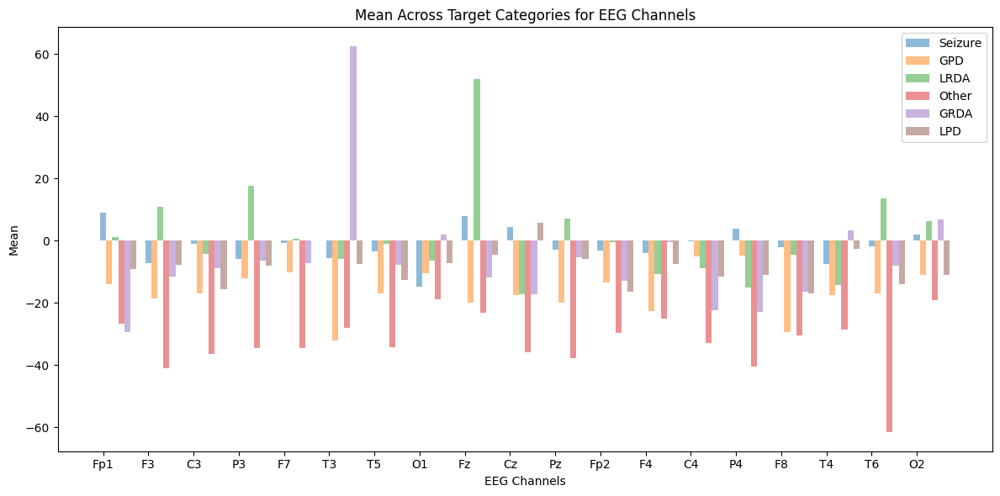

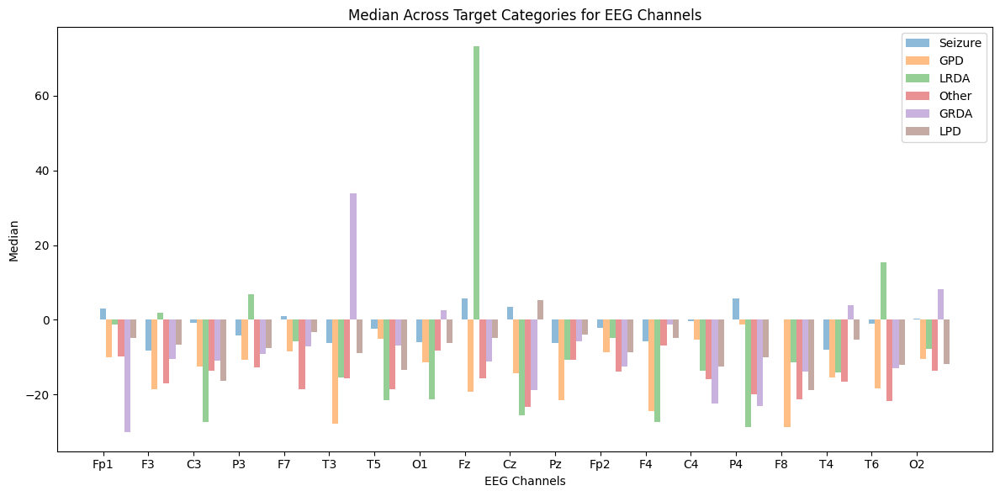

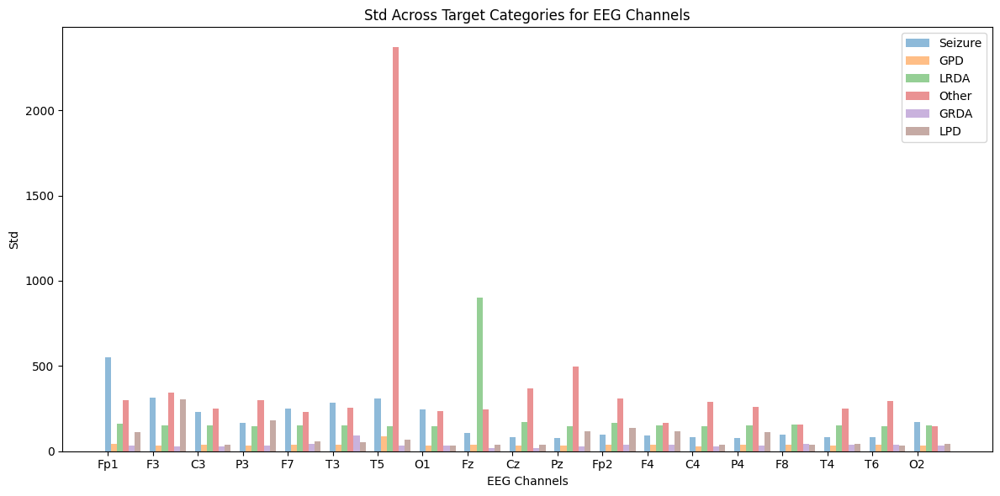

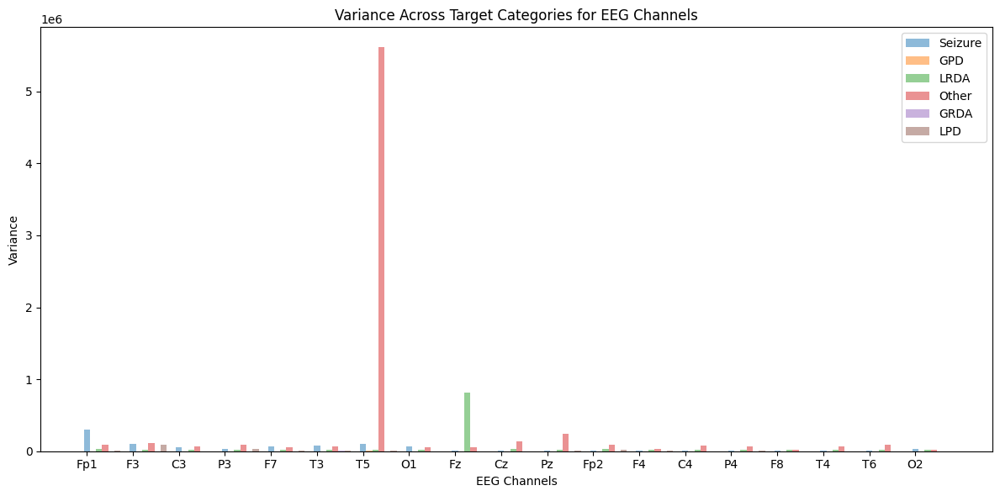

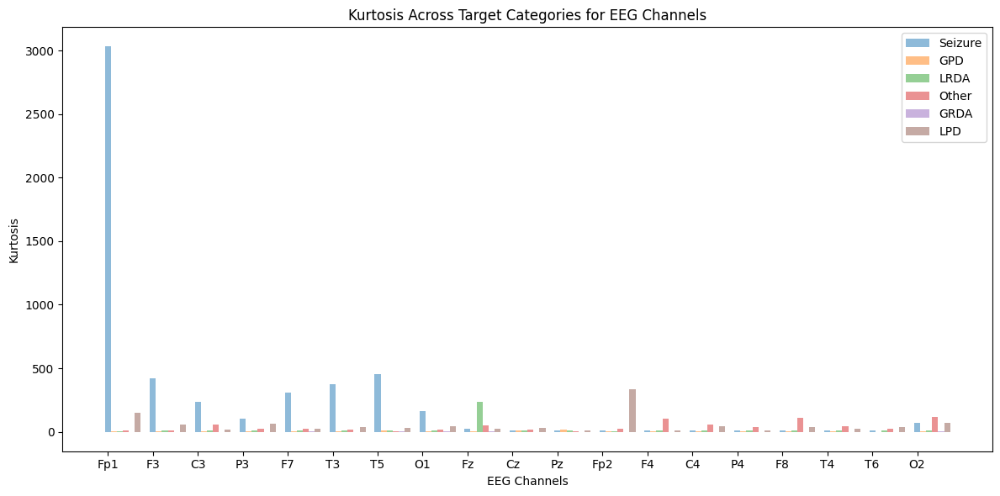

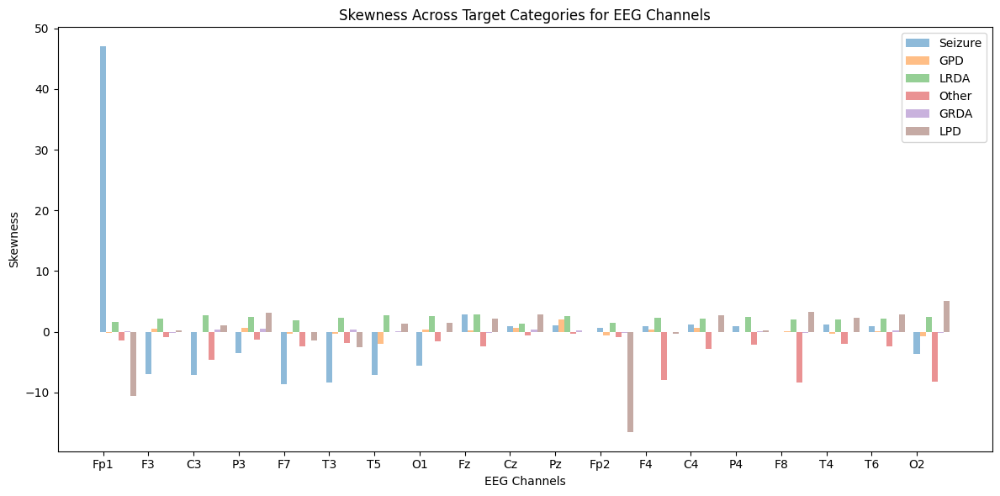

In [60]:
def plot_statistics(stats, statistic):
    categories = list(stats.keys())
    channels = list(stats[categories[0]][statistic].keys())
    num_categories = len(categories)
    num_channels = len(channels)

    fig, ax = plt.subplots(figsize=(12, 6))

    width = 0.8 / num_categories  # Adjust the width of bars based on the number of categories

    for i, category in enumerate(categories):
        values = [stats[category][statistic][channel] for channel in channels]
        x_pos = [j + width * i for j in range(num_channels)]
        ax.bar(x_pos, values, width=width, alpha=0.5, label=category)

    ax.set_xlabel('EEG Channels')
    ax.set_ylabel(statistic.capitalize())
    ax.set_title(f'{statistic.capitalize()} Across Target Categories for EEG Channels')
    ax.set_xticks(range(num_channels))
    ax.set_xticklabels(channels)
    ax.legend()

    plt.tight_layout()
    plt.show()

plot_statistics(stats, 'mean')
plot_statistics(stats, 'median')
plot_statistics(stats, 'std')
plot_statistics(stats, 'variance')
plot_statistics(stats, 'kurtosis')
plot_statistics(stats, 'skewness')

# Filtering methods

In [62]:
from scipy.signal import butter, lfilter
from scipy.signal import medfilt
import plotly.graph_objs as go

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a
def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y

def butter_lowpass_filter(data, cutoff_freq=20, sampling_rate=200, order=4):
    nyquist = 0.5 * sampling_rate
    normal_cutoff = cutoff_freq / nyquist
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    filtered_data = lfilter(b, a, data, axis=0)
    return filtered_data

def median(signal):# input: numpy array 1D (one column)
    array=np.array(signal)
    #applying the median filter
    med_filtered=sp.signal.medfilt(array, kernel_size=3) # applying the median filter order3(kernel_size=3)
    return  med_filtered # return the med-filtered signal: numpy array 1D

Reference for denoise - https://www.kaggle.com/code/yusaku5739/eeg-signal-denosing-using-wavelet-transform#Denoising-function

In [63]:
def maddest(d, axis=None):
    return np.mean(np.absolute(d - np.mean(d, axis)), axis)

def denoise(x, wavelet='haar', level=1):
    ret = {key:[] for key in x.columns}

    for pos in x.columns:
        coeff = pywt.wavedec(x[pos], wavelet, mode="per")
        sigma = (1/0.6745) * maddest(coeff[-level])

        uthresh = sigma * np.sqrt(2*np.log(len(x)))
        coeff[1:] = (pywt.threshold(i, value=uthresh, mode='hard') for i in coeff[1:])

        ret[pos]=pywt.waverec(coeff, wavelet, mode='per')

    return np.array([ret[key] for key in x.columns.values]).T

In [64]:
grouped = eeg_data_15.groupby('eeg_id')

# Get unique eeg_id values
unique_eeg_ids = grouped.groups.keys()

# Randomly select five eeg_id values
selected_eeg_ids = np.random.choice(list(unique_eeg_ids), size=5, replace=False)

# Filter the dataset to include only the selected eeg_id values
random_eegs = [grouped.get_group(eeg_id) for eeg_id in selected_eeg_ids]

eeg_columns = ['Fp1', 'F3', 'C3', 'P3', 'F7', 'T3', 'T5', 'O1', 'Fz', 'Cz', 'Pz', 'Fp2', 'F4', 'C4', 'P4', 'F8', 'T4', 'T6', 'O2']

In [65]:
def plot_before_and_after(eeg, filtered_eeg):
  mse = mean_squared_error(eeg, filtered_eeg)

  # Create a new figure with two subplots
  plt.figure(figsize=(14, 5))

  # Plot original signal
  plt.subplot(1, 2, 1)
  plt.plot(t, eeg, label='Original Signal', alpha=0.7)
  plt.title(f'Original Signal {i}')
  plt.xlabel('Time (s)')
  plt.ylabel('Amplitude')
  plt.legend()
  plt.grid(True)

  # Plot filtered signal
  plt.subplot(1, 2, 2)
  plt.plot(t, filtered_eeg, label='Filtered Signal', alpha=0.7)
  plt.title('Filtered Signal')
  plt.xlabel('Time (s)')
  plt.ylabel('Amplitude')
  plt.legend()
  plt.grid(True)

  # Adjust layout
  plt.tight_layout()
  plt.show()

  return mse

In [66]:
def plot_filtered_and_original_channel_wise(eeg, filtered_signals):
    num_channels = len(eeg.columns)

    # Create a new figure for each channel
    for idx, column in enumerate(eeg.columns):
        fig = go.Figure()

        # Plot original signal
        fig.add_trace(go.Scatter(x=t, y=eeg[column], mode='lines', name='Original Signal', line=dict(color='blue')))
        filter_colors = ['red', 'green', 'purple']
        # Plot filtered signals
        for filt_idx, filtered_eeg in enumerate(filtered_signals):
            if filt_idx == 0:
                filter_label = 'Lowpass Filtered'
            elif filt_idx == 1:
                filter_label = 'Median Filtered'
            else:
                filter_label = 'Denoise'
         # Assign color based on filter index
            filter_color = filter_colors[filt_idx % len(filter_colors)]

            fig.add_trace(go.Scatter(x=t, y=filtered_eeg[:, idx], mode='lines', name=f'{filter_label}', line=dict(color=filter_color)))

        fig.update_layout(title=f'{column} Original vs Filtered Signals',
                          xaxis_title='Time (s)',
                          yaxis_title='Amplitude',
                          legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
                          margin=dict(l=0, r=0, t=50, b=0))

        fig.show()

In [71]:
lowcut = 1  # Lower cutoff frequency (Hz)
highcut = 20  # Upper cutoff frequency (Hz)
fs = 200
t = np.arange(0, 15, 1/fs)
num_samples = fs*15
i=0

for eeg in random_eegs:
  i=i+1
  eeg = eeg[eeg_columns]
  eeg = eeg.head(num_samples)
  # Apply filter
  bandpass_filtered_signal = butter_bandpass_filter(eeg, lowcut, highcut, fs, order=5)

for eeg in random_eegs:
  i=i+1
  eeg = eeg[eeg_columns]
  eeg = eeg.head(num_samples)

  filtered_signal = median(eeg)

  # plot_before_and_after(eeg, filtered_signal)


In [72]:
def plot_signals(eeg):
  eeg = eeg[eeg_columns]
  eeg = eeg.head(num_samples)
  # bandpass_filtered_signal = butter_bandpass_filter(eeg, 0.5, 20, fs, order=5)
  bandpass_filtered_signal = butter_lowpass_filter(eeg)
  filtered_signal = median(eeg)
  denoise_eeg = denoise(eeg, wavelet="db8")
  filtered_signals = [bandpass_filtered_signal, filtered_signal, denoise_eeg]

  plot_filtered_and_original_channel_wise(eeg, filtered_signals)

In [68]:
def plot_all_filters(eeg):
  eeg = eeg[eeg_columns]
  eeg = eeg.head(num_samples)
  # bandpass_filtered_signal = butter_bandpass_filter(eeg, 0.5, 20, fs, order=5)
  bandpass_filtered_signal = butter_lowpass_filter(eeg)

  denoise_eeg = denoise(pd.DataFrame(bandpass_filtered_signal), wavelet="db8")
  filtered_signals = [denoise_eeg]

  plot_filtered_and_original_channel_wise(eeg, filtered_signals)

In [75]:
plot_signals(random_eegs[0])

In [76]:
plot_all_filters(random_eegs[0])